In [1]:
*Enzyme kenetics;
data enzy;
input Y X;
datalines;
    2.1    1.0
    2.5    1.5
    4.9    2.0
    5.5    3.0
    7.0    4.0
    8.4    5.0
    9.6    6.0
   10.2    7.5
   11.4    8.5
   12.5   10.0
   13.1   12.5
   14.6   15.0
   17.0   17.5
   16.8   20.0
   18.6   25.0
   19.7   30.0
   21.3   35.0
   21.6   40.0
;
run;

SAS Connection established. Subprocess id is 2237



In [2]:
*Transformation first;
data q1;
set enzy;
x_1 = 1/x;
y_1 = 1/y;
run;

In [3]:
proc print data=q1 (obs=3);
run;

Obs,Y,X,x_1,y_1
1,2.1,1.0,1.00000,0.47619
2,2.5,1.5,0.66667,0.40000
3,4.9,2.0,0.50000,0.20408



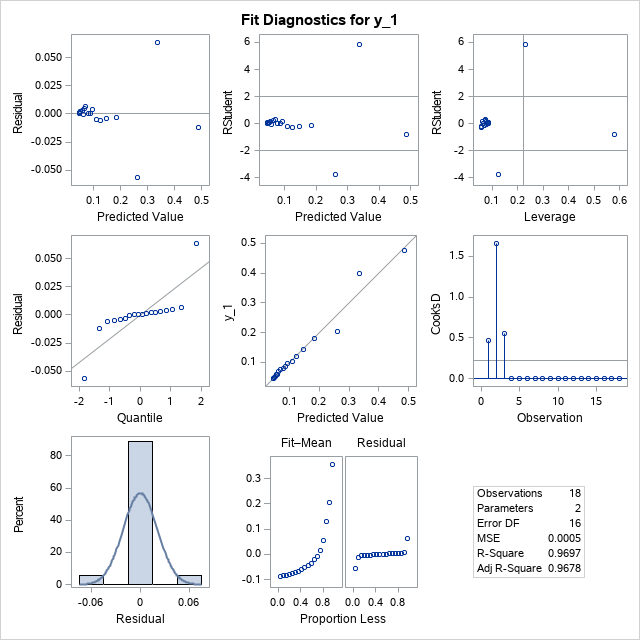
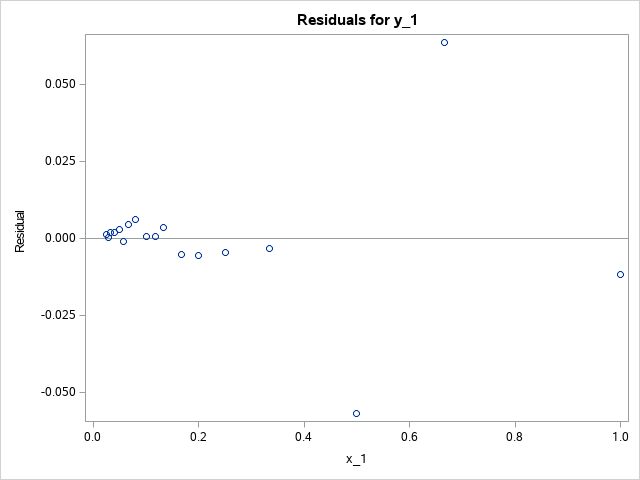
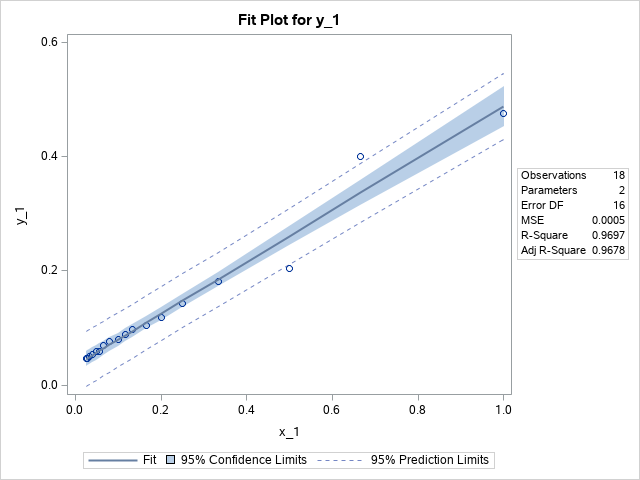

In [5]:
*fit linear regression to find the initials;
proc reg data=q1;
model y_1=x_1;
run;


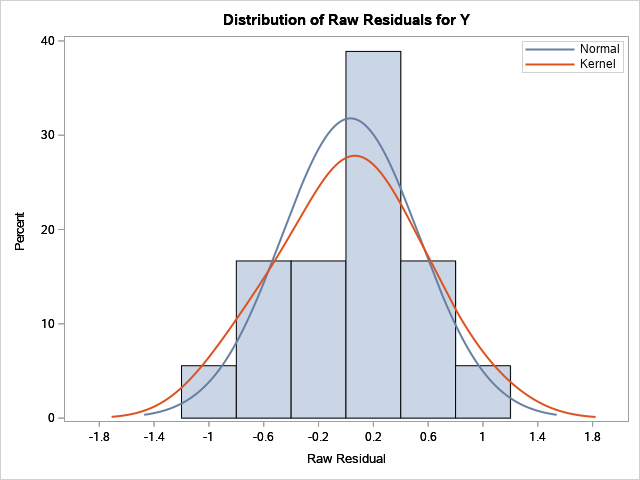
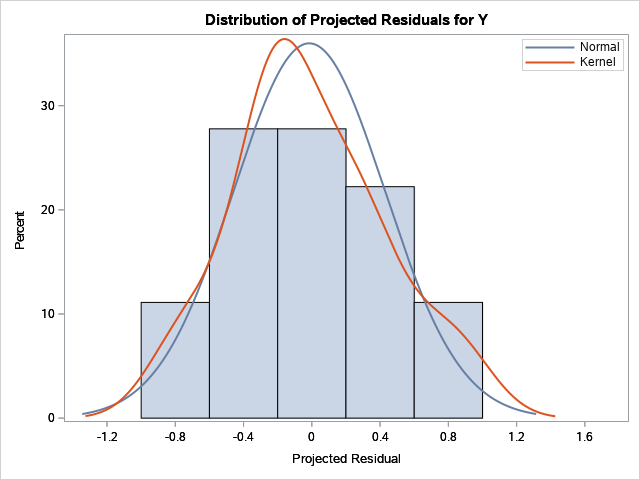
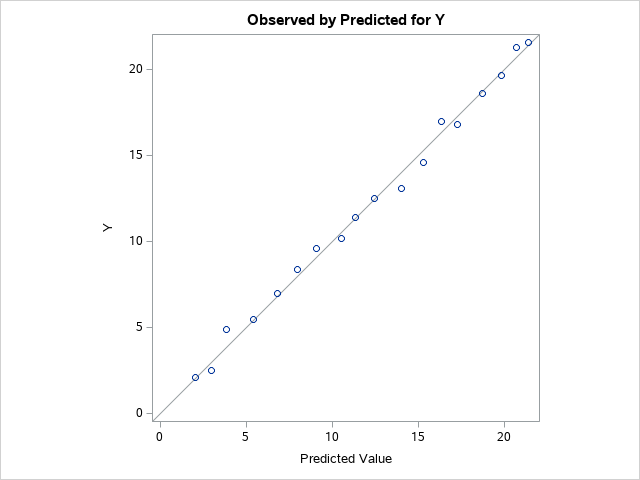
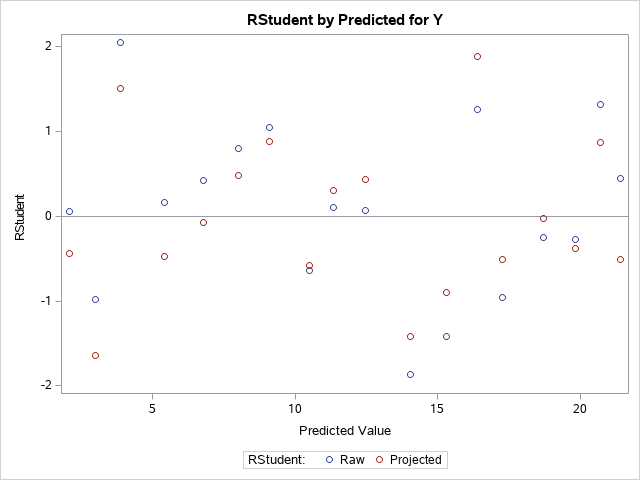
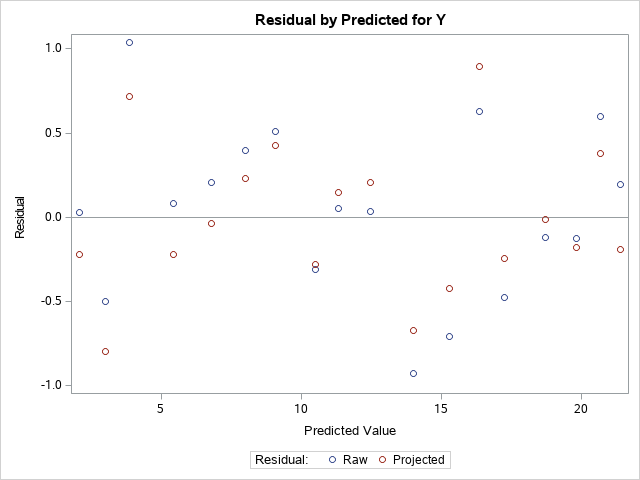
...
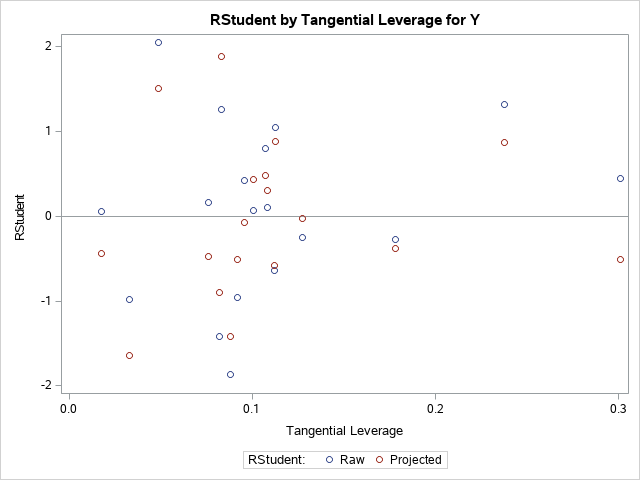
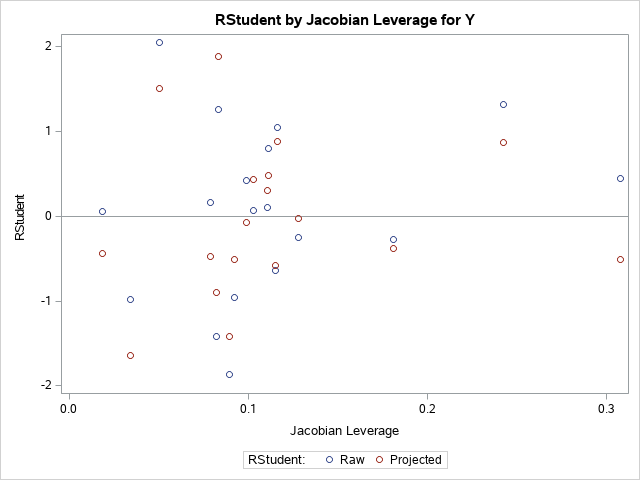
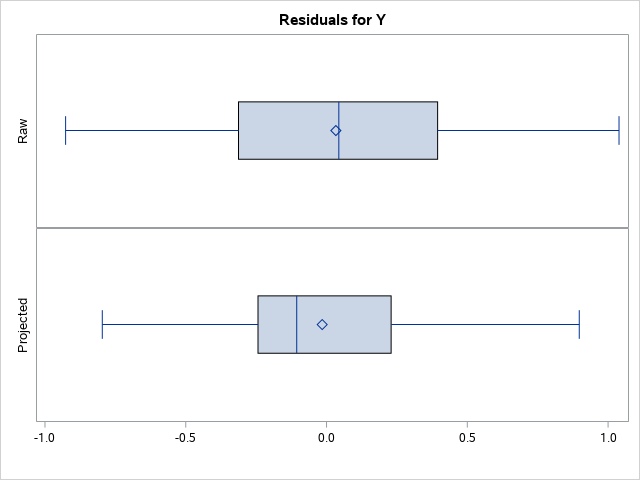
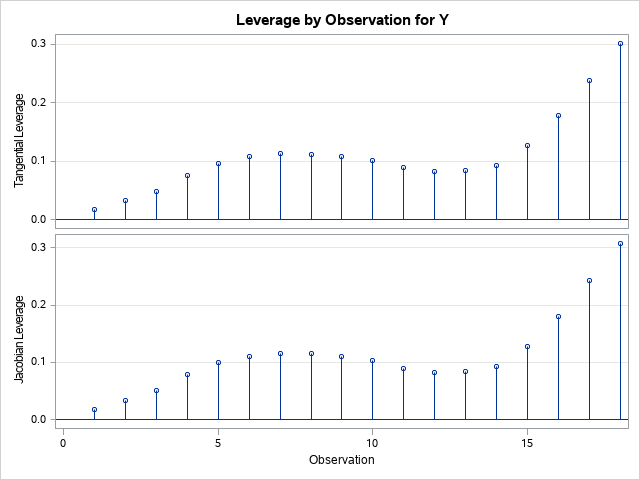
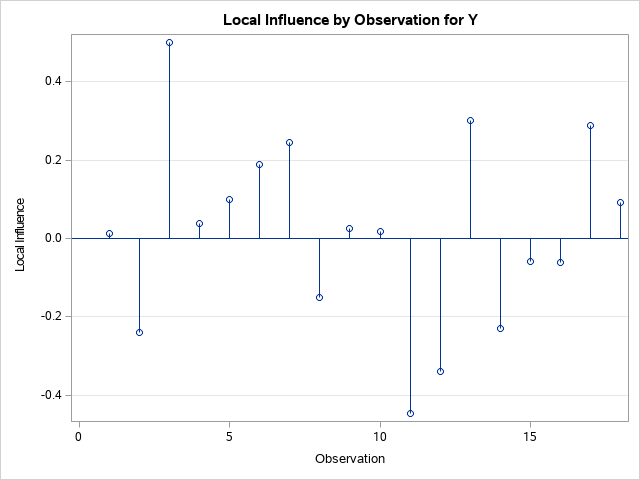

In [3]:
*fit nonlinear model with initial values;
proc nlin data=q1 outest=out1 plots(stats=all)=diagnostics(unpack);
    parameters gamma0=29.62085 gamma1=13.44816;
    model y = gamma0*x/(gamma1+x);
    output out=fitout p=hat r=resid;
run;


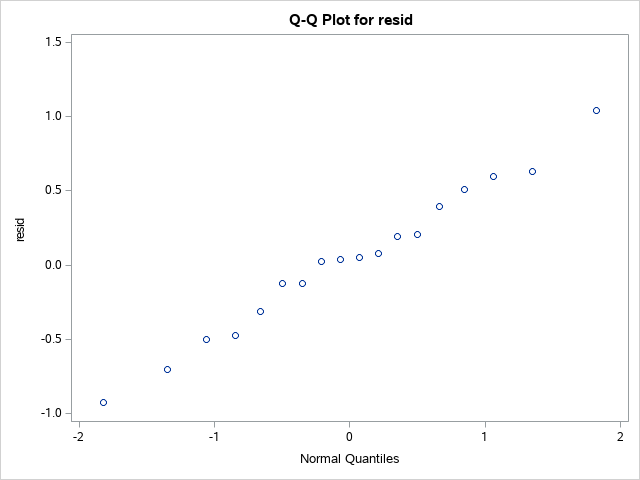

In [18]:
*Q-Q plot of residuals;
proc univariate data=fitout;
 qqpot resid / normal;
run;

In [7]:
*bootstrap confidence interval;

/*****************************************************
                  Bootstrapping
****************************************************/
/********** 1st: Get 1000 data sets*****************/

%let nBoot =  1000;
%let nObs = 18;

data booterror; /*get the sampled residuals*/
do sampnum = 1 to &nBoot; 
   do i=1 to &nObs;
   ebootnumb=round(ranuni(321488)*&nObs); 
      set fitout /*Saved the fitted and residual values here*/
            point=ebootnumb;
            keep sampnum resid;
            output;
        end;
     end;
    stop;
run;


data bootrep; 
do sampnum = 1 to &nBoot; 
        do i= 1 to &nObs;
        set fitout /*Saved the fitted and residual values here*/
            point=i;
            keep sampnum x hat;
            output;
       end;
    end;
    stop;
run;


data bootsamp;
merge bootrep booterror;
by sampnum;
   yboot = hat+resid;
keep sampnum x yboot;
run;

In [9]:
proc print data = bootsamp(obs = 100);
run;

Obs,sampnum,X,yboot
1,1,1.0,2.1529
2,1,1.5,2.8720
3,1,2.0,4.4885
4,1,3.0,5.4557
5,1,4.0,7.8293
6,1,5.0,8.0323
7,1,6.0,9.2985
8,1,7.5,10.5637
9,1,8.5,12.3874
10,1,10.0,12.8590


In [10]:
/******** Then obtain the 1000 boostrap estimators *************/
proc nlin data=bootsamp outest=bootest; 
by sampnum;
parameters  gamma0=29.62085 gamma1=13.44816;
    model yboot = gamma0*x/(gamma1+x);
run; 

In [11]:
data histos;
set bootest;
if _TYPE_ ne 'FINAL' then delete;
run;


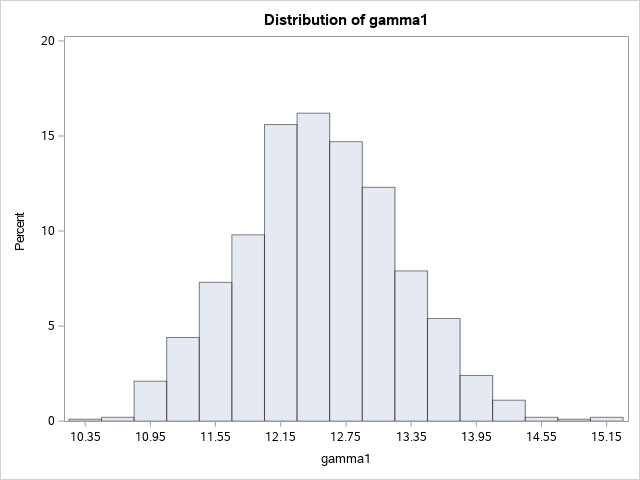

In [12]:
/************ Plot histograms and look at the percentiles********/
proc univariate data = histos ;
var gamma1;
histogram gamma1;
output out=percentiles1 pctlpts=2.5,97.5 pctlpre=gamma1;
run;

proc print data=percentiles1; run; /* percentile confidence interval is based on percentiles */ 
/*reflection confidence intervals can also be constructed*/

In [13]:
data process;
input Y X1 X2;
datalines;
   12.0    1.0    1.0
   32.0   10.0    1.0
  103.0  100.0    1.0
   20.0    1.0   10.0
   61.0   10.0   10.0
  198.0  100.0   10.0
   38.0    1.0  100.0
  133.0   10.0  100.0
  406.0  100.0  100.0
    8.0    1.0    1.0
   38.0   10.0    1.0
   98.0  100.0    1.0
   14.0    1.0   10.0
   56.0   10.0   10.0
  205.0  100.0   10.0
   43.0    1.0  100.0
  128.0   10.0  100.0
  398.0  100.0  100.0
  ;
  run;

In [22]:
data q2;
set process;
Y_2 = log10(Y);
X1_2 = log10(X1);
X2_2 = log10(X2);
run;

In [23]:
proc print data=q2 (obs=10);
run;

Obs,Y,X1,X2,Y_2,X1_2,X2_2
1,12,1,1,1.07918,0,0
2,32,10,1,1.50515,1,0
3,103,100,1,2.01284,2,0
4,20,1,10,1.30103,0,1
5,61,10,10,1.78533,1,1
6,198,100,10,2.29667,2,1
7,38,1,100,1.57978,0,2
8,133,10,100,2.12385,1,2
9,406,100,100,2.60853,2,2
10,8,1,1,0.90309,0,0



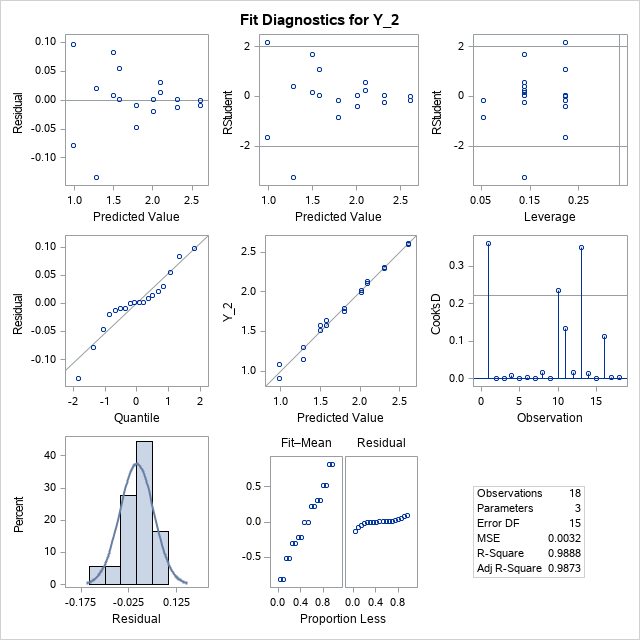
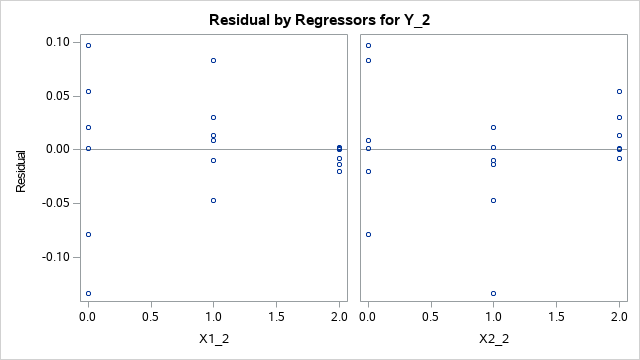

In [24]:
* get initial values;
proc reg data=q2;
model Y_2 = X1_2 X2_2;
run;


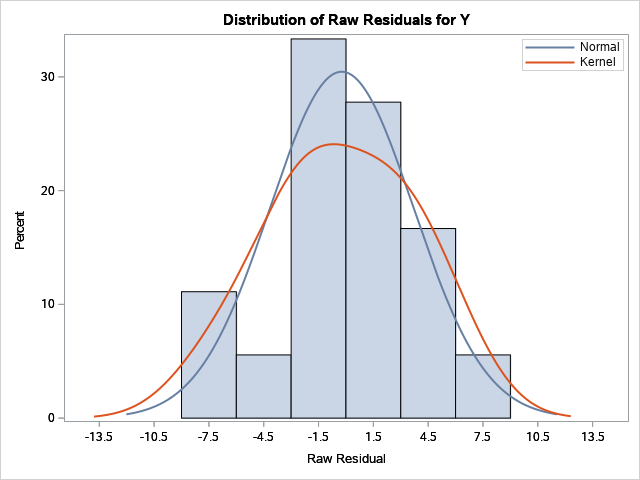
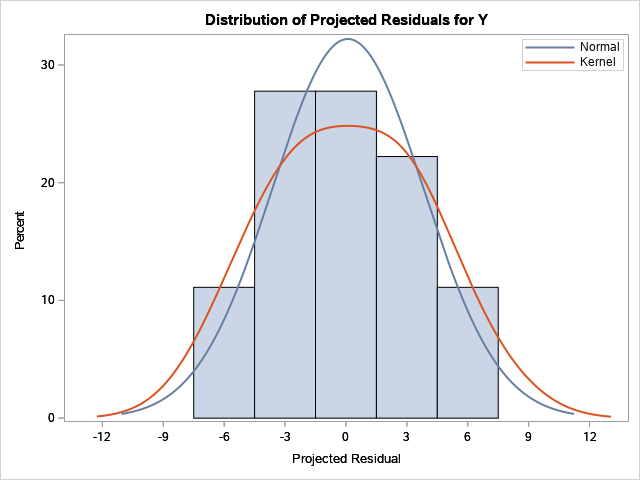
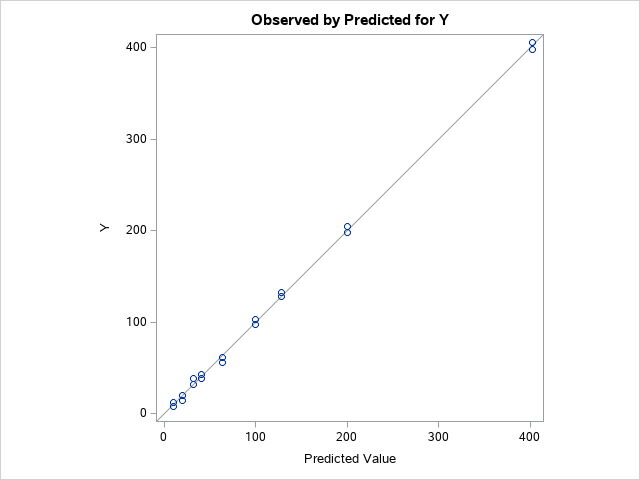
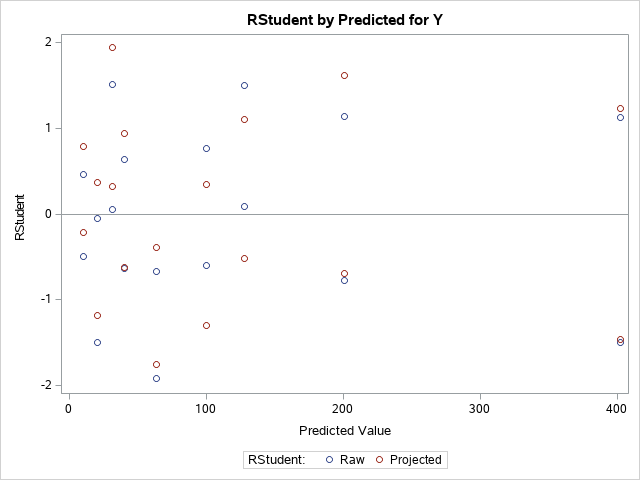
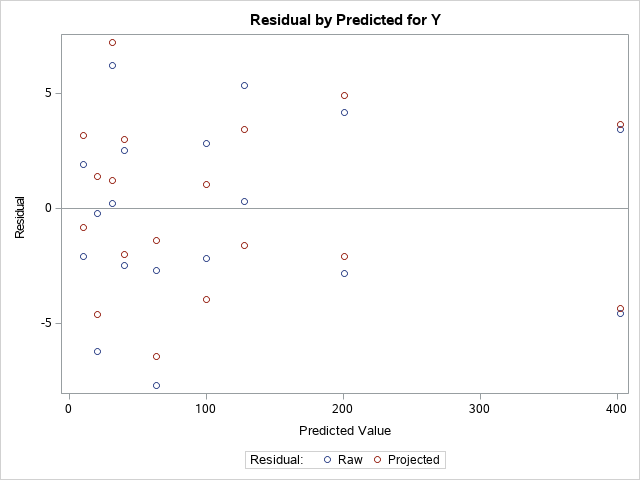
...
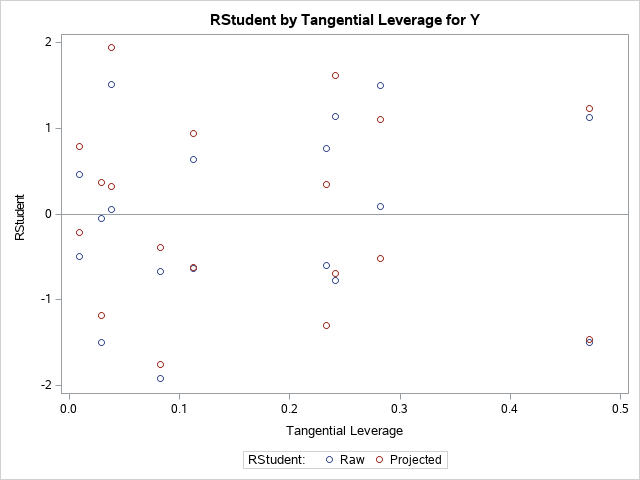
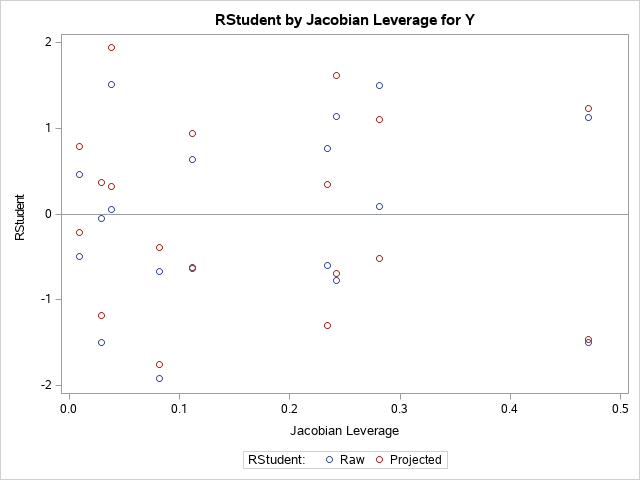
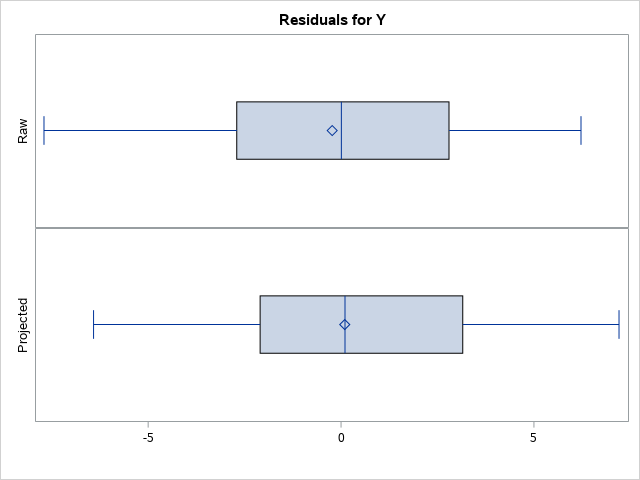
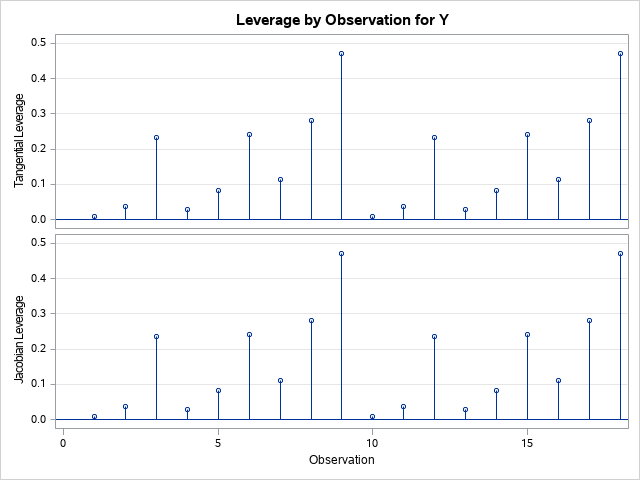
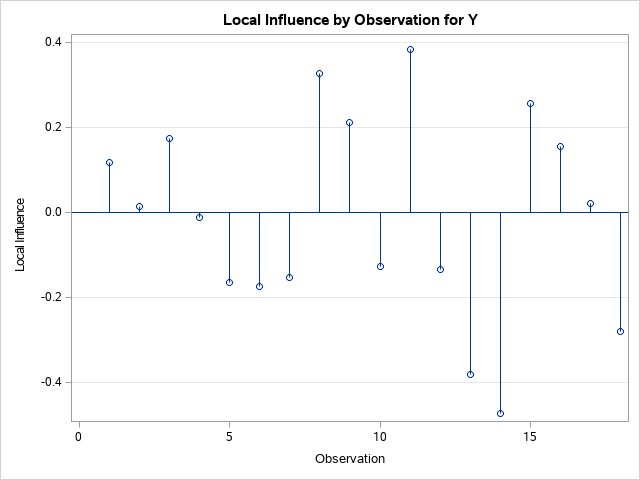

In [26]:
*fit nonlinear model with initial values;
proc nlin data=q2 outest=out1 plots(stats=all)=diagnostics(unpack);
    parameters gamma0=9.591135 gamma1=0.51485 gamma2=0.29845;
    model Y = gamma0*(X1**gamma1)*(X2**gamma2);
    output out=fitout p=hat r=resid;
run;

In [28]:
*test gamma0=gamma1;

*full model;
proc nlin data=q2 outest = full_out;
parameters gamma0=9.591135 gamma1=0.51485 gamma2=0.29845;
model Y = gamma0*(X1**gamma1)*(X2**gamma2);
run;

In [29]:
*reduced model;
proc nlin data=q2 outest = red_out;
parameters gamma0=9.591135 gamma1=0.51485;
model Y = gamma0*(X1**gamma1)*(X2**gamma1);
run;

In [39]:
/************** Bonferroni to see what parameters are different
**********************************/
proc nlin data=q2 outest = full_out;
parameters gamma0=9.591135 gamma1=0.51485 gamma2=0.29845;
model Y = gamma0*(X1**gamma1)*(X2**gamma2);
output  PARMS=Par_est;
run; 

In [48]:
data __;
B = tinv(1-0.05/(2*2),15);
run;
proc print;
run;

Obs,B
1,2.48988


In [43]:
proc print data=full_out; 
run;

Obs,_TYPE_,_STATUS_,_NAME_,_ITER_,_SSE_,gamma0,gamma1,gamma2
1,ITER,2 Iteration,,0,367.600,9.5911,0.51485,0.29845
2,ITER,2 Iteration,,1,264.110,10.0837,0.49845,0.30188
3,ITER,2 Iteration,,2,263.443,10.0796,0.49871,0.30199
4,ITER,2 Iteration,,3,263.443,10.0797,0.49871,0.30199
5,FINAL,0 Converged,,.,263.443,10.0797,0.49871,0.30199
6,COVB,0 Converged,gamma0,.,263.443,0.1585,-0.00268,-0.00094
7,COVB,0 Converged,gamma1,.,263.443,-0.0027,0.00006,0.00000
8,COVB,0 Converged,gamma2,.,263.443,-0.0009,0.00000,0.00002
